[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/miokobayashii/summerschool2022/blob/main/day03/DCGAN_cifa10_dog.ipynb)


# Introduction to Generative Adversarial Networks

### Generate Dog Images by GAN using cifar10 data set

In [1]:
import scipy
from keras.datasets import cifar10


# Load the dataset
(X_train, y_train), (_, _) = cifar10.load_data()

# Extract dogs 
#cifar10_labels = np.array([
#    'airplane',
#    'automobile',
#    'bird',
#    'cat',
#    'deer',
#    'dog',
#    'frog',
#    'horse',
#    'ship',
#    'truck'])

X_dogs = X_train[(y_train == 5).flatten()]
#X_train = np.vstack((X_cats, X_dogs))
X_train = X_dogs       

170508288/170498071 [==============================] - 4s 0us/step


### Show some of dog images 

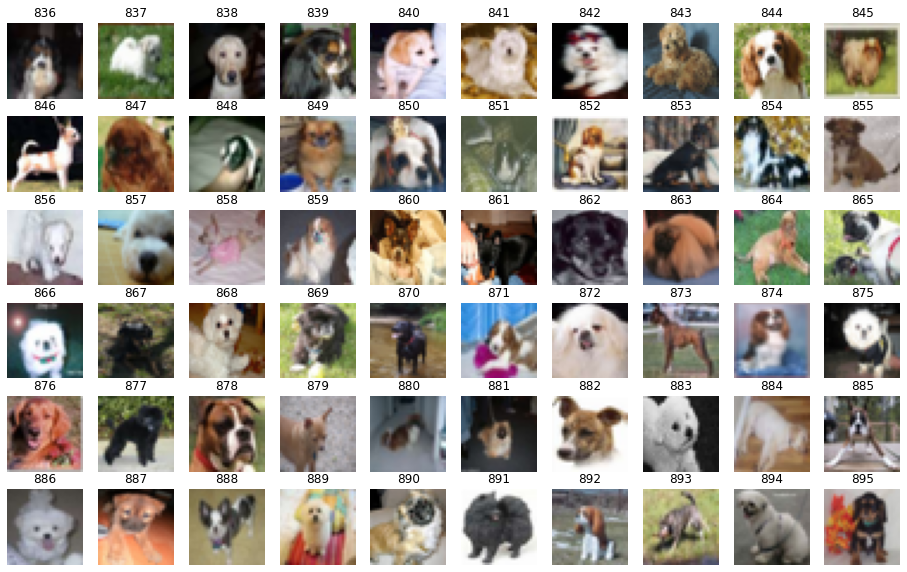

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import random
index = random.randint(0, X_train.shape[0]/2)
i = index
pos = 1


plt.figure(figsize=(16,10))

# draw cifar10 images and label names
for img in X_train[index:index+60]:
    plt.subplot(6, 10, pos)
    plt.imshow(img)
    plt.axis('off')
    plt.title( i )
    pos += 1
    i += 1

plt.show()

In [3]:
print(X_train.shape[0], X_train.shape[1],X_train.shape[2],X_train.shape[3])

5000 32 32 3


In [4]:
from keras.models import Sequential, Model
from keras.layers import BatchNormalization, ZeroPadding2D, Dense, Dropout, Activation, Flatten
from keras.layers import Input,Conv2D, MaxPooling2D, Reshape, Conv2DTranspose
from keras.layers import LeakyReLU
from keras.optimizers import adam_v2

### Generator

In [18]:
img_rows = X_train.shape[1]
img_cols = X_train.shape[2]
channels = X_train.shape[3]
img_shape = (img_rows, img_cols, channels)
optimizer = adam_v2.Adam(0.001, 0.5)
z_dim = 100

def build_generator():       
    model=Sequential()
   # model.add(Input(shape=z_dim))
    model.add(Dense(units=8*8*256, input_dim=z_dim))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU())
    
    model.add(Reshape( (8, 8, 256) ) )
    model.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    
    model.add(Conv2DTranspose(512, kernel_size=4, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))

    model.add(Conv2D(3, kernel_size=4, padding="same", activation="tanh"))
    model.compile(loss='binary_crossentropy', optimizer=optimizer)    
    return model

gen=build_generator()
gen.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 16384)             1654784   
                                                                 
 batch_normalization_3 (Batc  (None, 16384)            65536     
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16384)             0         
                                                                 
 reshape_1 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 16, 16, 256)      1048832   
 ranspose)                                                       
                                                                 
 batch_normalization_4 (Batc  (None, 16, 16, 256)     

### Discriminator

In [19]:
def build_discriminator():

    model = Sequential()

    model.add(Input(shape=img_shape))
    model.add(Conv2D(64, kernel_size=4, strides=2, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.2))
    model.add(Conv2D(128, kernel_size=4, strides=2, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

dis = build_discriminator()
dis.summary()
dis.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=['accuracy'])


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 16, 16, 64)        3136      
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 dropout_2 (Dropout)         (None, 16, 16, 64)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 8, 8, 128)         131200    
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 dropout_3 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten_1 (Flatten)         (None, 8192)             

### Buid GAN

In [20]:
def build_combined(gen, dis):
    z = Input(shape=(z_dim,))
    img = gen(z)
    dis.trainable = False
    valid = dis(img)
    model = Model(z, valid)
    model.summary()
    return model

In [21]:
combined = build_combined(gen, dis)
combined.compile(loss='binary_crossentropy', optimizer=optimizer)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 100)]             0         
                                                                 
 sequential_2 (Sequential)   (None, 32, 32, 3)         4894467   
                                                                 
 sequential_3 (Sequential)   (None, 1)                 142529    
                                                                 
Total params: 5,036,996
Trainable params: 4,860,163
Non-trainable params: 176,833
_________________________________________________________________


In [22]:
def train(X_train, gen, dis, combined, epochs, batch_size=128, sample_interval=50):

       # # Load the dataset
       # (X_train, _), (_, _) = mnist.load_data()

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        #X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, z_dim))

            # Generate a batch of new images
            gen_imgs = gen.predict(noise)

            # Train the discriminator
            d_loss_real = dis.train_on_batch(imgs, valid)
            d_loss_fake = dis.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, z_dim))

            # Train the generator (to have the discriminator label samples as valid)
            # In the combined model, the discriminator is not trained. 
            g_loss = combined.train_on_batch(noise, valid) 


            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                
                # Plot the progress
                print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))
                sample_images(epoch, gen)

In [23]:

def sample_images(epoch, gen):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, z_dim))
    gen_imgs = gen.predict(noise)
    #print(gen_imgs.shape)
    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5
    
    fig, axs = plt.subplots(r, c,
                            figsize=(c*1.5,r*1.5),
                            sharey=True,
                            sharex=True,facecolor='skyblue')
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,:])
            axs[i,j].axis('off')
            cnt += 1
    #fig.savefig("images/%d.png" % epoch)
    plt.show()

0 [D loss: 0.715108, acc.: 14.06%] [G loss: 0.355159]


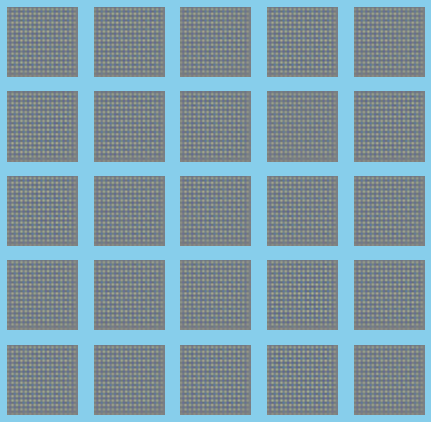

KeyboardInterrupt: ignored

In [24]:
train(X_train, gen, dis, combined, epochs=10000, batch_size=32, sample_interval=50)

In [ ]:
gen.save('generater.h5')
dis.save('discriminator.h5')

In [ ]:
train(X_train, gen, dis, combined, epochs=100000, batch_size=32, sample_interval=50)

0 [D loss: 0.697899, acc.: 50.00%] [G loss: 0.714806]
1 [D loss: 0.673462, acc.: 54.69%] [G loss: 0.717066]
2 [D loss: 0.691530, acc.: 48.44%] [G loss: 0.702293]
3 [D loss: 0.706942, acc.: 37.50%] [G loss: 0.720220]
4 [D loss: 0.697838, acc.: 45.31%] [G loss: 0.718293]
5 [D loss: 0.698611, acc.: 46.88%] [G loss: 0.740674]
6 [D loss: 0.670439, acc.: 65.62%] [G loss: 0.715757]
7 [D loss: 0.653695, acc.: 57.81%] [G loss: 0.729939]
8 [D loss: 0.715209, acc.: 51.56%] [G loss: 0.726608]
9 [D loss: 0.712247, acc.: 45.31%] [G loss: 0.701386]
10 [D loss: 0.677924, acc.: 62.50%] [G loss: 0.756032]
11 [D loss: 0.715487, acc.: 39.06%] [G loss: 0.730501]
12 [D loss: 0.699210, acc.: 42.19%] [G loss: 0.695454]
13 [D loss: 0.703739, acc.: 50.00%] [G loss: 0.698113]
14 [D loss: 0.700564, acc.: 48.44%] [G loss: 0.705478]
15 [D loss: 0.693275, acc.: 53.12%] [G loss: 0.708096]
16 [D loss: 0.703511, acc.: 39.06%] [G loss: 0.700096]
17 [D loss: 0.700590, acc.: 43.75%] [G loss: 0.689999]
18 [D loss: 0.686547

In [ ]:
gen.save('generater_2.h5')
dis.save('discriminator_2.h5')

In [ ]:
train(X_train, gen, dis, combined, epochs=100000, batch_size=32, sample_interval=50)

0 [D loss: 0.708462, acc.: 43.75%] [G loss: 0.744508]
1 [D loss: 0.703342, acc.: 56.25%] [G loss: 0.749880]
2 [D loss: 0.670401, acc.: 54.69%] [G loss: 0.747588]
3 [D loss: 0.675651, acc.: 54.69%] [G loss: 0.720880]
4 [D loss: 0.691481, acc.: 56.25%] [G loss: 0.731084]
5 [D loss: 0.691244, acc.: 50.00%] [G loss: 0.714222]
6 [D loss: 0.698676, acc.: 43.75%] [G loss: 0.747750]
7 [D loss: 0.705418, acc.: 45.31%] [G loss: 0.749974]
8 [D loss: 0.703174, acc.: 45.31%] [G loss: 0.739321]
9 [D loss: 0.659352, acc.: 67.19%] [G loss: 0.727451]
10 [D loss: 0.707683, acc.: 43.75%] [G loss: 0.732419]
11 [D loss: 0.704003, acc.: 48.44%] [G loss: 0.735078]
12 [D loss: 0.689208, acc.: 53.12%] [G loss: 0.756042]
13 [D loss: 0.695743, acc.: 50.00%] [G loss: 0.720041]
14 [D loss: 0.703617, acc.: 43.75%] [G loss: 0.768395]
15 [D loss: 0.652214, acc.: 54.69%] [G loss: 0.759407]
16 [D loss: 0.669209, acc.: 57.81%] [G loss: 0.757686]
17 [D loss: 0.701007, acc.: 54.69%] [G loss: 0.752848]
18 [D loss: 0.684468

In [ ]:
gen.save('generater_3.h5')
dis.save('discriminator_3.h5')

In [ ]:
train(X_train, gen, dis, combined, epochs=100000, batch_size=32, sample_interval=50)

0 [D loss: 0.686683, acc.: 54.69%] [G loss: 0.742436]
1 [D loss: 0.698766, acc.: 51.56%] [G loss: 0.744296]
2 [D loss: 0.680136, acc.: 51.56%] [G loss: 0.823274]
3 [D loss: 0.692662, acc.: 45.31%] [G loss: 0.712992]
4 [D loss: 0.664163, acc.: 67.19%] [G loss: 0.759656]
5 [D loss: 0.699757, acc.: 48.44%] [G loss: 0.766310]
6 [D loss: 0.674471, acc.: 60.94%] [G loss: 0.790077]
7 [D loss: 0.644212, acc.: 59.38%] [G loss: 0.747355]
8 [D loss: 0.731457, acc.: 43.75%] [G loss: 0.834682]
9 [D loss: 0.694084, acc.: 56.25%] [G loss: 0.720082]
10 [D loss: 0.662869, acc.: 56.25%] [G loss: 0.790616]
11 [D loss: 0.688692, acc.: 50.00%] [G loss: 0.747056]
12 [D loss: 0.701895, acc.: 53.12%] [G loss: 0.744713]
13 [D loss: 0.716590, acc.: 43.75%] [G loss: 0.795166]
14 [D loss: 0.655389, acc.: 57.81%] [G loss: 0.787461]
15 [D loss: 0.662691, acc.: 54.69%] [G loss: 0.810217]
16 [D loss: 0.631335, acc.: 65.62%] [G loss: 0.764705]
17 [D loss: 0.712823, acc.: 51.56%] [G loss: 0.789765]
18 [D loss: 0.658005

In [ ]:
gen.save('generater_4.h5')
dis.save('discriminator_4.h5')

In [ ]:
#plt.figure(figsize=(32,20))
def sample_images_test(epoch, gen):
    r, c = 10, 10
    noise = np.random.normal(0, 1, (r * c, z_dim))
    gen_imgs = gen.predict(noise)
    #print(gen_imgs.shape)
    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5
    print(gen_imgs.shape[0], gen_imgs.shape[1], gen_imgs.shape[2])
    pos = 1

    fig = plt.figure(figsize=(16,10))
    for img in gen_imgs[0:r*c]:
        plt.subplot(r, c, pos)
        plt.imshow(img)
        plt.axis('off')
        #plt.title( i )
        pos += 1
        #i += 1

    fig.savefig("images/%s.png" % epoch)
    plt.close()

    #fig, axs = plt.subplots(r, c)
    #cnt = 0
    #for i in range(r):
    #    for j in range(c):
    #        axs[i,j].imshow(gen_imgs[cnt, :,:,:])
    #        axs[i,j].axis('off')
    #        cnt += 1
    #fig.savefig("images/%s.png" % epoch)
    #plt.close()

In [ ]:
sample_images_test("sample", gen)

100 32 32
